In [1]:
import matplotlib.pyplot as plt 
import numpy as np 
import os 
import PIL 
import tensorflow as tf 
from tensorflow import keras 
from tensorflow.keras import layers 
from tensorflow.keras.models import Sequential

In [3]:
import pathlib 
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)
data_dir = data_dir / "flower_photos"
if not os.path.exists(data_dir):
    raise FileNotFoundError(f"Dataset directory not found at: {data_dir}")

In [5]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(f"Total images found: {image_count}")
if image_count == 0:
    print("Warning: No images found. Check your dataset path and format.")
    all_files = list(data_dir.glob('*/*'))
    print(f"Found files (first 5): {[str(f) for f in all_files[:5]]}")

Total images found: 3670


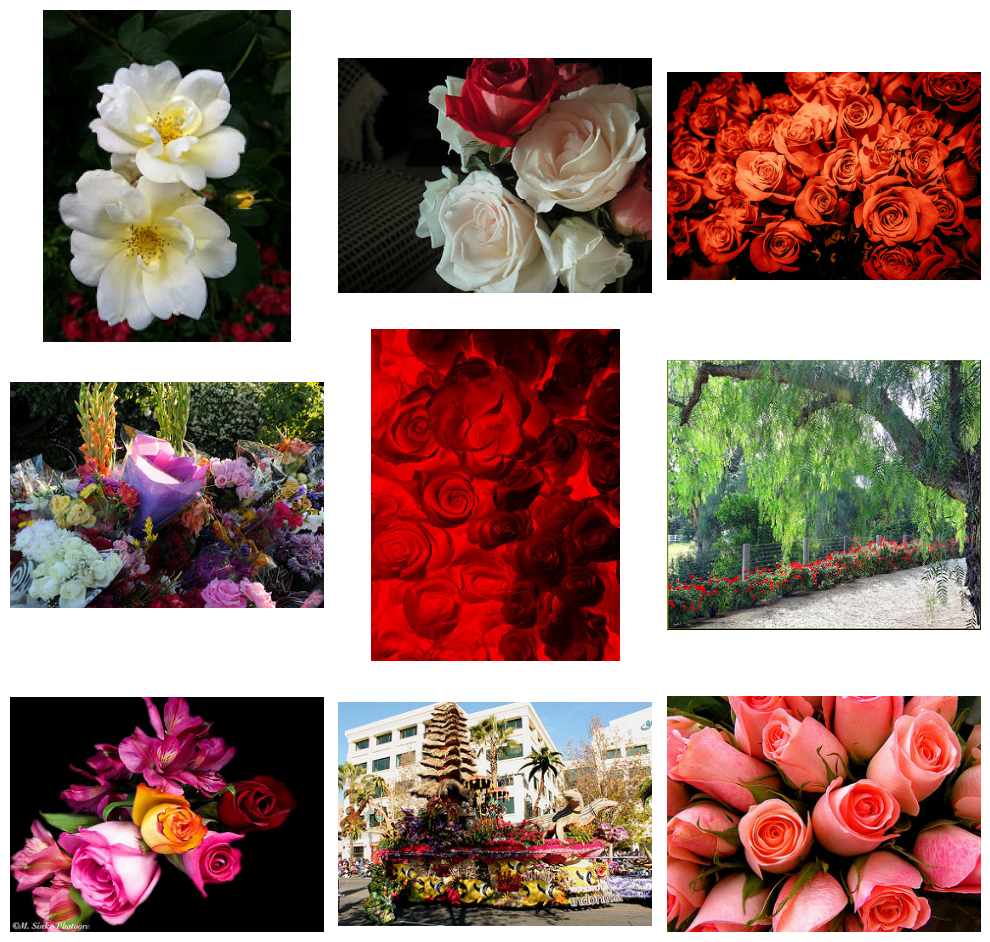

In [7]:
import matplotlib.pyplot as plt
from PIL import Image
import pathlib

# Load 9 rose image paths
rose_images = list((data_dir / 'roses').glob('*.jpg'))[:9]

# Set up the plot
plt.figure(figsize=(10, 10))

for i, img_path in enumerate(rose_images):
    img = Image.open(img_path)
    
    # Create a subplot: 3x3 grid
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # Hide axis ticks

plt.tight_layout()
plt.show()

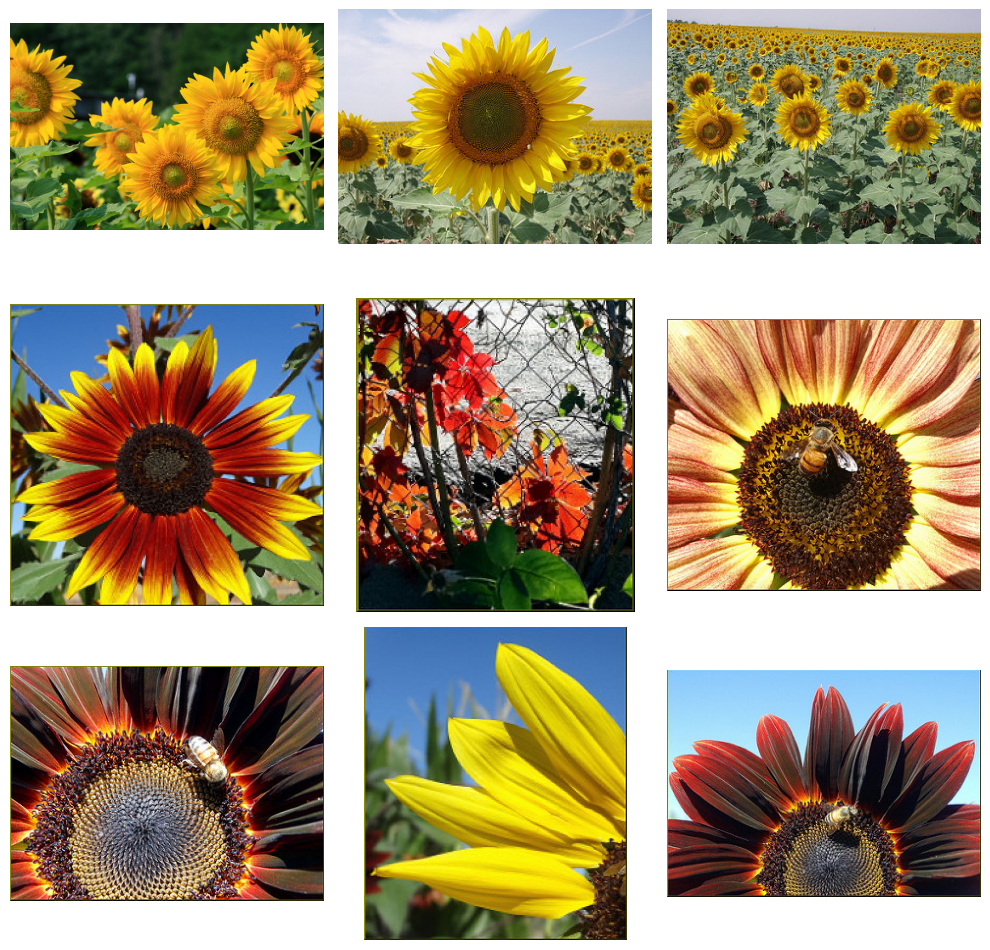

In [8]:
sunflowers_images = list((data_dir / 'sunflowers').glob('*.jpg'))[:9]

# Set up the plot
plt.figure(figsize=(10, 10))

for i, img_path in enumerate(sunflowers_images):
    img = Image.open(img_path)
    
    # Create a subplot: 3x3 grid
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # Hide axis ticks

plt.tight_layout()
plt.show()

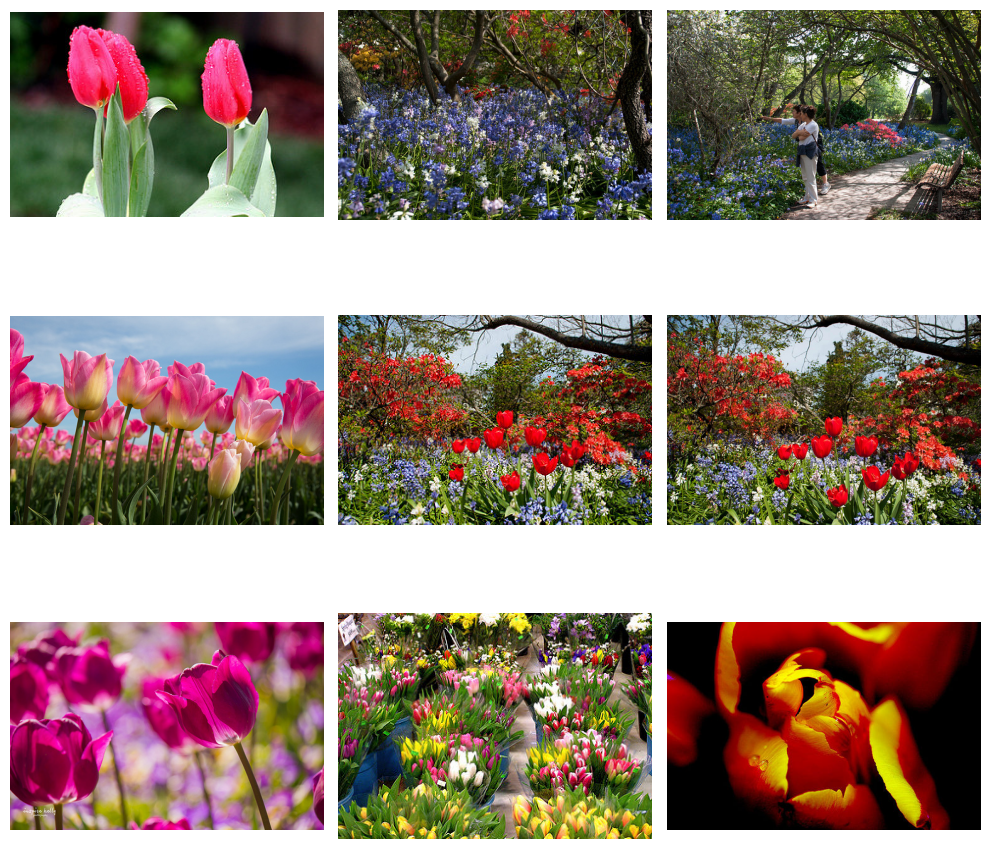

In [9]:
tulips_images = list((data_dir / 'tulips').glob('*.jpg'))[:9]

# Set up the plot
plt.figure(figsize=(10, 10))

for i, img_path in enumerate(tulips_images):
    img = Image.open(img_path)
    
    # Create a subplot: 3x3 grid
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # Hide axis ticks

plt.tight_layout()
plt.show()

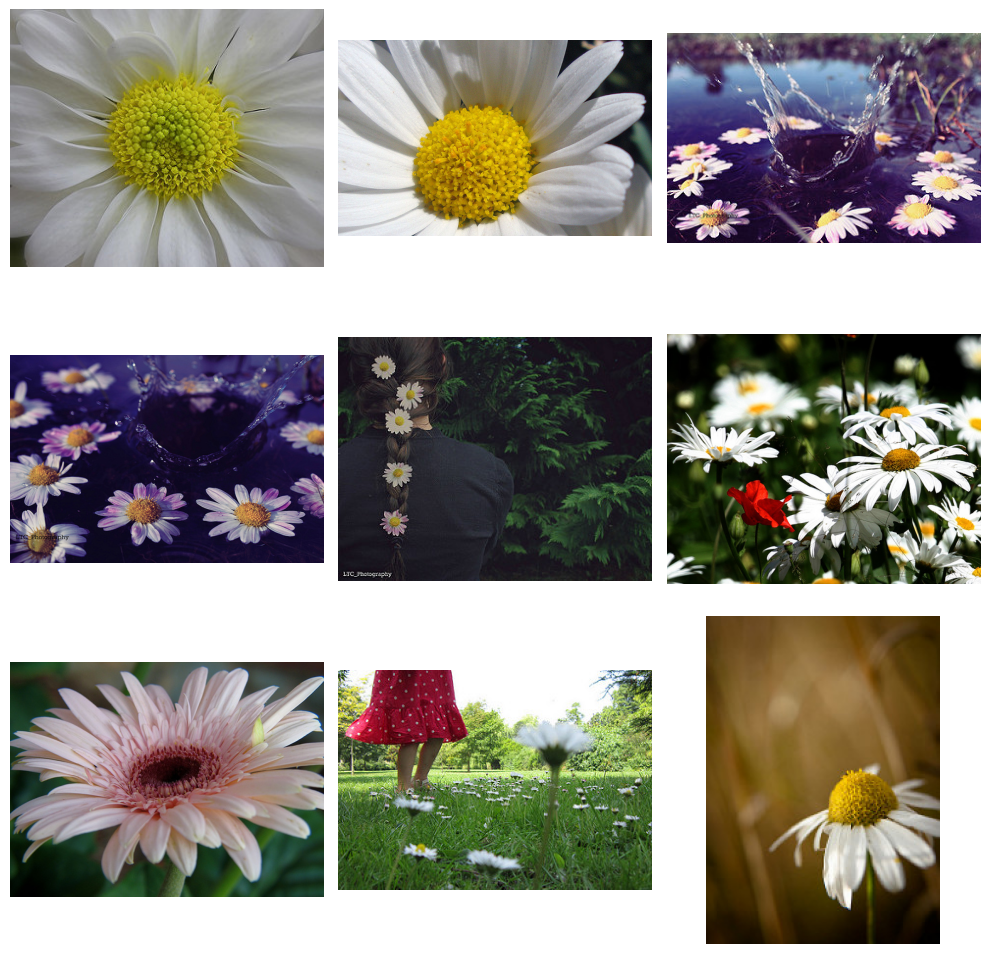

In [11]:
daisy_images = list((data_dir / 'daisy').glob('*.jpg'))[:9]

# Set up the plot
plt.figure(figsize=(10, 10))

for i, img_path in enumerate(daisy_images):
    img = Image.open(img_path)
    
    # Create a subplot: 3x3 grid
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # Hide axis ticks

plt.tight_layout()
plt.show()

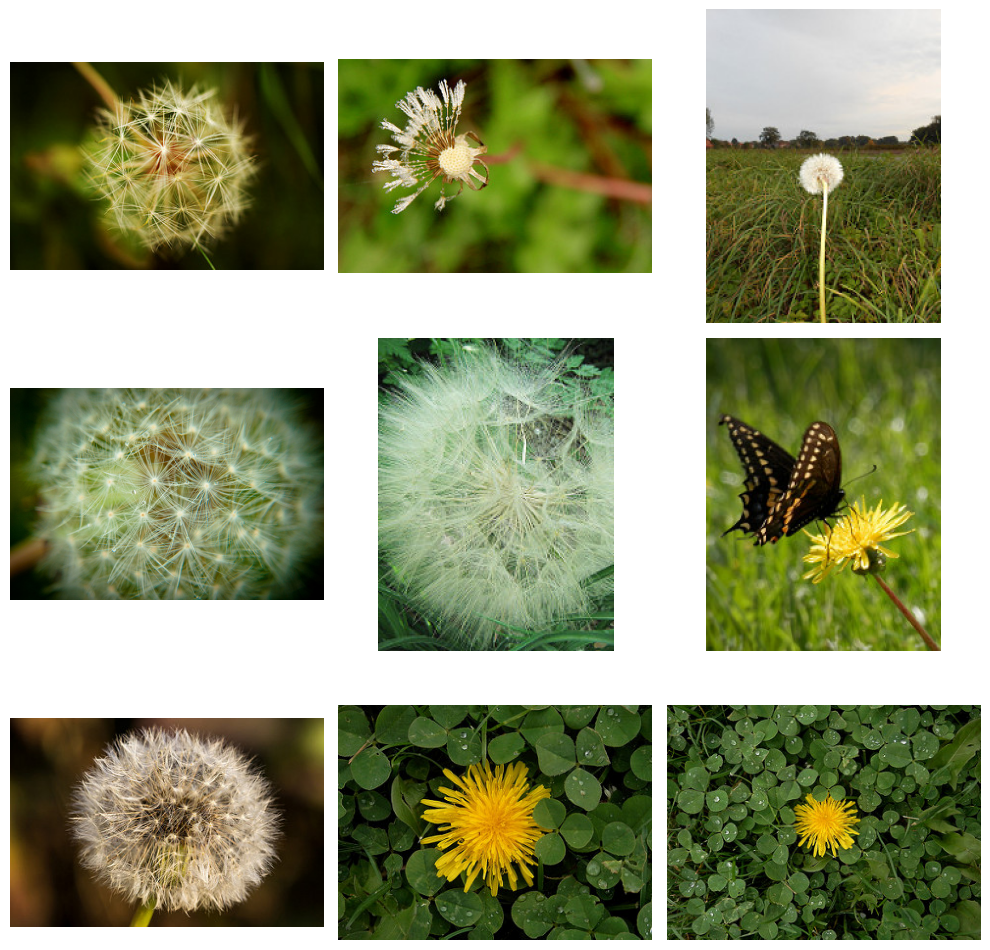

In [12]:
dandelion_images = list((data_dir / 'dandelion').glob('*.jpg'))[:9]

# Set up the plot
plt.figure(figsize=(10, 10))

for i, img_path in enumerate(dandelion_images):
    img = Image.open(img_path)
    
    # Create a subplot: 3x3 grid
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')  # Hide axis ticks

plt.tight_layout()
plt.show()

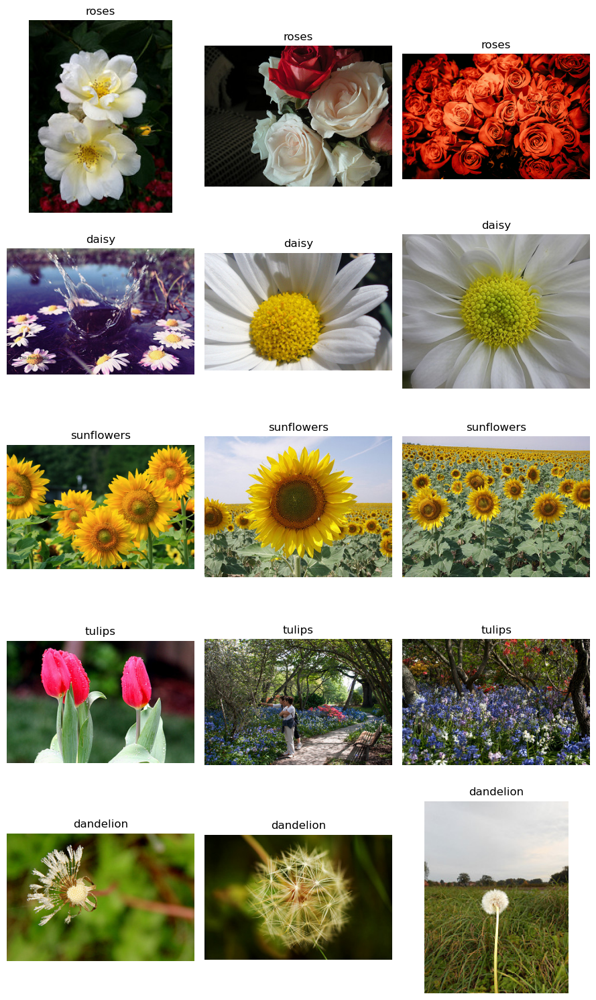

In [13]:
import matplotlib.pyplot as plt
from PIL import Image
import pathlib
import random

# Define categories to show
categories = ['roses', 'daisy', 'sunflowers', 'tulips', 'dandelion']
images_per_class = 3  # number of images per class to display

# Set up the grid: rows = categories, columns = images
plt.figure(figsize=(images_per_class * 3, len(categories) * 3))

for row, category in enumerate(categories):
    folder = data_dir / category
    image_paths = list(folder.glob('*.jpg'))[:images_per_class]
    random.shuffle(image_paths)  # Shuffle the images
    selected_images = image_paths[:images_per_class]  # Take first N after shuffle
    
    for col, img_path in enumerate(image_paths):
        img = Image.open(img_path)
        plt.subplot(len(categories), images_per_class, row * images_per_class + col + 1)
        plt.imshow(img)
        plt.title(category)
        plt.axis('off')

plt.tight_layout()
plt.show()

In [15]:
train_ds = tf.keras.utils.image_dataset_from_directory( 
	data_dir, 
	validation_split=0.2, 
	subset="training", 
	seed=123, 
	image_size=(180, 180), 
	batch_size=32)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [17]:
val_ds = tf.keras.utils.image_dataset_from_directory( 
	data_dir, 
	validation_split=0.2, 
	subset="validation", 
	seed=123, 
	image_size=(180,180), 
	batch_size=32)

Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [19]:
class_names = train_ds.class_names 
print(class_names)

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


In [20]:
for images, labels in train_ds.take(1):
    print(images.shape)  # (32, 180, 180, 3)
    print(labels.numpy())  # e.g., [2 0 3 1 ...]

(32, 180, 180, 3)
[2 1 4 3 1 2 1 2 4 1 4 4 3 4 1 2 0 4 1 1 1 4 3 2 3 1 4 2 2 3 4 3]


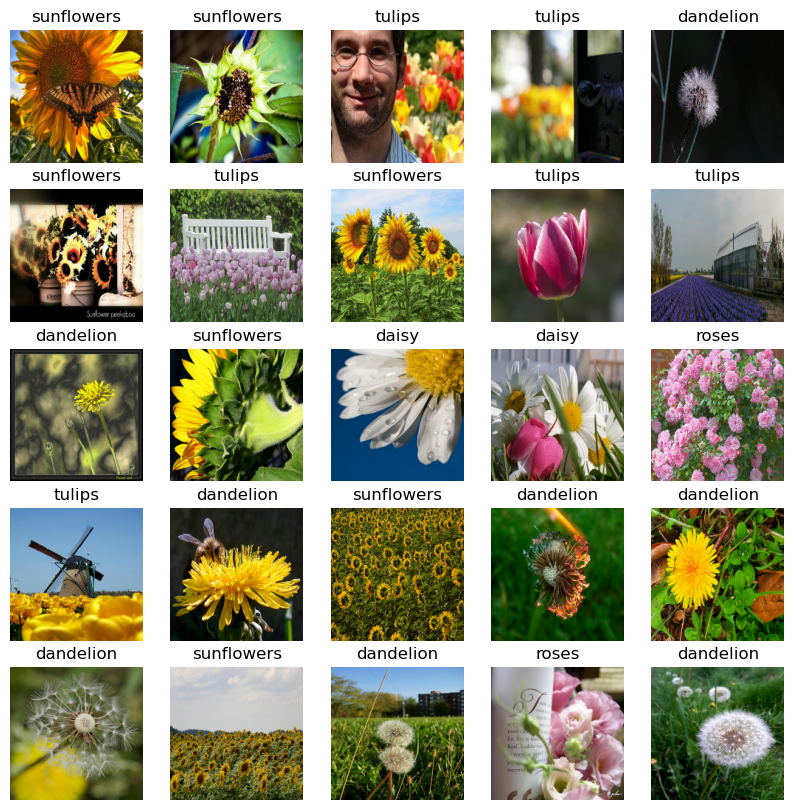

In [21]:
import matplotlib.pyplot as plt 
plt.figure(figsize=(10, 10)) 
for images, labels in train_ds.take(1): 
    for i in range(25): 
        ax = plt.subplot(5, 5, i + 1) 
        plt.imshow(images[i].numpy().astype("uint8")) 
        plt.title(class_names[labels[i]]) 
        plt.axis("off")

In [22]:
num_classes = len(class_names) 
model = Sequential([ 
	layers.Rescaling(1./255, input_shape=(180,180, 3)), 
	layers.Conv2D(16, 3, padding='same', activation='relu'), 
	layers.MaxPooling2D(), 
	layers.Conv2D(32, 3, padding='same', activation='relu'), 
	layers.MaxPooling2D(), 
	layers.Conv2D(64, 3, padding='same', activation='relu'), 
	layers.MaxPooling2D(), 
	layers.Flatten(), 
	layers.Dense(128, activation='relu'), 
	layers.Dense(num_classes) 
])

C:\Users\nihal\anaconda3\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [23]:
model.compile(optimizer='adam', 
			loss=tf.keras.losses.SparseCategoricalCrossentropy( 
				from_logits=True), 
			metrics=['accuracy']) 
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)                │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 180, 180, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 90, 90, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 90, 90, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 45, 45, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 45, 45, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 22, 22, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 30976)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,965,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,989,285 (15.22 MB)

 Trainable params: 3,989,285 (15.22 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
epochs=10
history = model.fit( 
train_ds, 
validation_data=val_ds, 
epochs=epochs 
)

Epoch 1/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 22s 192ms/step - accuracy: 0.3497 - loss: 1.5033 - val_accuracy: 0.5749 - val_loss: 1.0670
Epoch 2/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 185ms/step - accuracy: 0.6063 - loss: 1.0172 - val_accuracy: 0.6267 - val_loss: 0.9667
Epoch 3/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 183ms/step - accuracy: 0.6675 - loss: 0.8517 - val_accuracy: 0.6213 - val_loss: 0.8970
Epoch 4/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 186ms/step - accuracy: 0.7459 - loss: 0.6607 - val_accuracy: 0.6608 - val_loss: 0.9013
Epoch 5/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 184ms/step - accuracy: 0.8196 - loss: 0.5008 - val_accuracy: 0.6267 - val_loss: 1.0171
Epoch 6/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 19s 203ms/step - accuracy: 0.8966 - loss: 0.2829 - val_accuracy: 0.6485 - val_loss: 1.2226
Epoch 7/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 188ms/step - accuracy: 0.9517 - loss: 0.1539 - val_accuracy: 0.6322 - val_loss: 1.4687
Epoch 8/10
92/92 ━━━━━━━━━━━━━━━━━━━━ 17s 189ms/step - accuracy: 0.9611 - loss: 0.1210 - val_accu

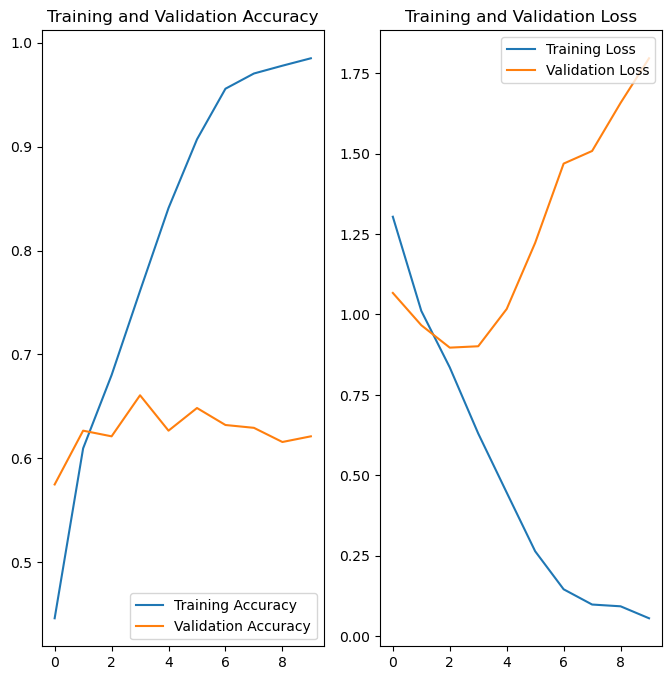

In [35]:
acc = history.history['accuracy'] 
val_acc = history.history['val_accuracy'] 
loss = history.history['loss'] 
val_loss = history.history['val_loss'] 
epochs_range = range(epochs) 
plt.figure(figsize=(8, 8)) 
plt.subplot(1, 2, 1) 
plt.plot(epochs_range, acc, label='Training Accuracy') 
plt.plot(epochs_range, val_acc, label='Validation Accuracy') 
plt.legend(loc='lower right') 
plt.title('Training and Validation Accuracy') 
plt.subplot(1, 2, 2) 
plt.plot(epochs_range, loss, label='Training Loss') 
plt.plot(epochs_range, val_loss, label='Validation Loss') 
plt.legend(loc='upper right') 
plt.title('Training and Validation Loss') 
plt.show()